| Assignment 1 contribution table   | Andreas Holm Matthiassen (s234838) | Hector Helt Jakobsen (s234822) | Teis Aggerholm (s234871) |
|-------------|---------|---------|---------|
| Part 1 | 100%     | 0%     | 0%     |
| Part 2 | 0%     | 100%     | 0%     |
| Part 3 | 0%     | 0%     | 100%     |

Link to our GitHub repository: `https://github.com/Andreas-Holm-2/02467-Assignment-2`

# `Part 1:` Properties of the real-world network of Computational Social Scientists


Exercise: Analyzing Networks through a Random Model
1. _Random Network_: Let's start by building a Random Network, acting as a baseline (or [\"null model\"](https://en.wikipedia.org/wiki/Null_model)) to understand the Computational Social Scientists Network better.

* First, calculate the probability (_p_) that makes the expected number of edges in our random network match the actual edge count in the Computational Social Scientists network. Refer to equation 3.2 in your Network Science textbook for guidance. After finding _p_, figure out the average degree (using the given formula).

In [1]:
N = 17833 # Total Nodes (authors) found in the week 4 exercises
L = 58544 # Total links (collaborations) found in the week 4 exercises

From the Network Science textbook, we have

$$
\langle L\rangle=\sum_{\mathrm{L}=0}^{\frac{\mathrm{N}(\mathrm{~N}-1)}{2}} \mathrm{Lp}_{\mathrm{L}}=\mathrm{p} \frac{\mathrm{~N}(\mathrm{~N}-1)}{2} \quad (3.2)
$$

Using this equation, we can derive a formula to calculate the probability (p) that makes the expected number of edges in our random network match the actual edge count in the Computational Social Scientists network

$$
\langle L\rangle = p \frac{N(N-1)}{2} \Leftrightarrow \frac {\langle L\rangle} {\frac{N(N-1)}{2}} = p \Leftrightarrow \frac {2 \langle L\rangle} {N(N-1)} = p
$$

Now using the formula to calculate $p$:

In [2]:
p = 2 * L / (N * (N-1))
p

0.0003682035087661039

Thus, $p \approx 0.00037$. This ensures expected number of edges in our random network match the actual edge count in the Computational Social Scientists network.


Now we use this p to calculate the expected average degree $\langle\mathrm{k}\rangle$:

$$
\langle\mathrm{k}\rangle=\frac{2\langle\mathrm{L}\rangle}{\mathrm{N}}=\mathrm{p}(\mathrm{~N}-1)
$$

In [3]:
avg_degree = p * (N-1)
avg_degree

6.565804968317165

The average degree is $\approx 6.57$

* Now, write a function to generate a Random Network that mirrors the Computational Social Scientists network in terms of node count, using your calculated _p_. Generate a random network by linking nodes in every possible pair with probability _p_. **Hint**: you can use the function [``np.random.uniform``](https://numpy.org/doc/stable/reference/random/generated/numpy.random.uniform.html) to draw samples from a uniform probability distribution.

In [4]:
import networkx as nx
import numpy as np

def generate_random_network(N, p):
    '''
    Funtion to generate a random network given with the same number of nodes and the same calculated value of p, which was found in the co-authorship network
    '''
    np.random.seed(0) # to ensure reproduceability 

    G = nx.Graph()
    G.add_nodes_from(range(N))

    for i in range(N):
        for j in range(i + 1, N):
            if np.random.uniform(0, 1) < p:
                G.add_edge(i, j)

    return G

The above function generates a Random Network that mirrors the Computational Social Scientists network in terms of node count, using the calculated $p$.

The function however, is very inefficient due to $O(n^2)$ time complexity, and for `n=17833` the network took approximately 3 minutes to generate.

For this reason, I will be utilizing the built-in Erdos-Renyi generator function in the NetworkX library to generate the Erdos-Renyi network.

In [47]:
import networkx as nx
import numpy as np

def generate_random_network(N, p):
    '''
    (function documentation: https://networkx.org/documentation/stable/reference/generated/networkx.generators.random_graphs.fast_gnp_random_graph.html)
    
    Note a seed=0 is included to ensure reproduceability
    '''
    
    G = nx.fast_gnp_random_graph(N, p, seed=0)

    return G

N = 17833 
L = 58544  
p = (2 * L) / (N * (N - 1))  

random_network = generate_random_network(N, p)
print(random_network) # security check
print()
print("Succesfully generated the random network")

Graph with 17833 nodes and 58750 edges

Succesfully generated the random network


In addition to generating the random network, i will be loading the Computational Social Scientists network, which will be used in the next exercise

In [48]:
import ast
from collections import defaultdict
import pandas as pd

def load_coauthorship_network():
    
    papers_df = pd.read_csv("final_paperdata.csv")

    coauthor_counts = defaultdict(int)

    all_author_ids = set()
    for author_list in papers_df['author_ids'].dropna():
        authors = ast.literal_eval(author_list)
        all_author_ids.update(authors)
        
        for i in range(len(authors)):
            for j in range(i + 1, len(authors)):
                coauthor_counts[(authors[i], authors[j])] += 1

    weighted_edgelist = [(a, b, w) for (a, b), w in coauthor_counts.items()]

    weighted_edgelist[:5]

    G = nx.Graph()
    G.add_nodes_from(all_author_ids)
    G.add_weighted_edges_from(weighted_edgelist)

    return G

coauthorship_network = load_coauthorship_network()
print(coauthorship_network) # security check

Graph with 17833 nodes and 58544 edges


* Visualize the network as you did for the Computational Social Scientists network in the exercise above (my version is below).

In [7]:
'''
We use the Netwulf library created by Ulf Aslak and Ben Maier for visualizing the two networks.

Please note the visualzation settings are completely the same for both networks (ensuring reproduceability) with the only exception being
the node color (for easier distinction).
'''
import netwulf as nw
import matplotlib.pyplot as plt


### Random network visualization:

In [49]:
largest_cc_random_network = max(nx.connected_components(random_network), key=len)
largest_cc_random_network_subgraph = random_network.subgraph(largest_cc_random_network).copy()

print(f"Original network: {random_network.number_of_nodes()} nodes, {random_network.number_of_edges()} edges")
print(f"Largest Connected Component: {largest_cc_random_network_subgraph.number_of_nodes()} nodes, {largest_cc_random_network_subgraph.number_of_edges()} edges")

Original network: 17833 nodes, 58750 edges
Largest Connected Component: 17811 nodes, 58750 edges


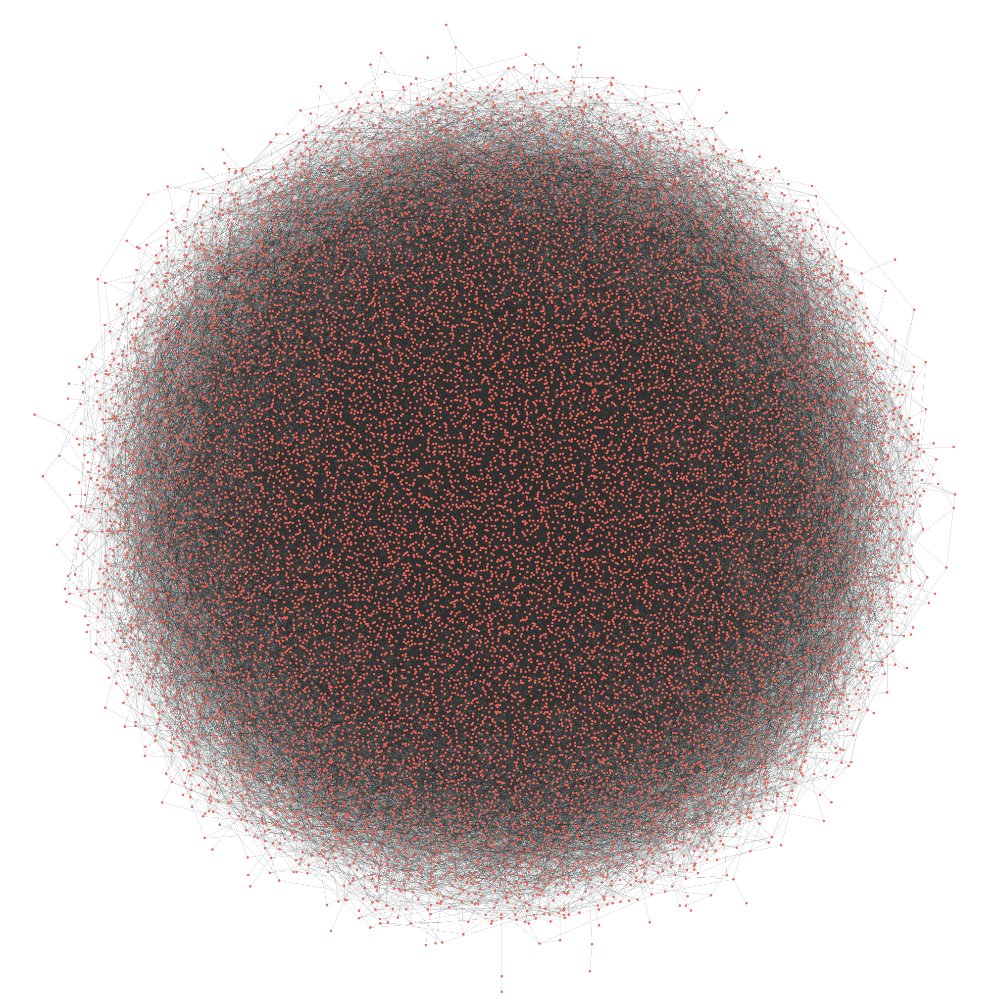

In [24]:

config_random_network = {
    # Input/output
    'zoom': 0.7,
    # Physics
    'node_charge': -90,
    'node_gravity': 0.27,
    'link_distance': 15,
    'link_distance_variation': 0,
    'node_collision': True,
    'wiggle_nodes': False,
    'freeze_nodes': False,
    # Nodes
    'node_fill_color': '#e57468',
    'node_stroke_color': '#ea5545',
    'node_label_color': '#000000',
    'display_node_labels': False,
    'scale_node_size_by_strength': False,
    'node_size': 5,
    'node_stroke_width': 1,
    'node_size_variation': 0.5,
    # Links
    'link_color': '#2e2e2e',
    'link_width': 0.3,
    'link_alpha': 0.79,
    'link_width_variation': 0.5,
    # Thresholding
    'display_singleton_nodes': True,
    'min_link_weight_percentile': 0,
    'max_link_weight_percentile': 1
}

network, config = nw.visualize(largest_cc_random_network_subgraph, plot_in_cell_below=False, config=config_random_network)

fig, ax = nw.draw_netwulf(network, figsize=20)
plt.savefig("Random_network.pdf")

### Computational Social Scientist network:

In [25]:
largest_cc_coauthorship_network = max(nx.connected_components(coauthorship_network), key=len)
largest_cc_coauthorship_network_subgraph = coauthorship_network.subgraph(largest_cc_coauthorship_network).copy()

print(f"Original network: {coauthorship_network.number_of_nodes()} nodes, {coauthorship_network.number_of_edges()} edges")
print(f"Largest Connected Component: {largest_cc_coauthorship_network_subgraph.number_of_nodes()} nodes, {largest_cc_coauthorship_network_subgraph.number_of_edges()} edges")

Original network: 17833 nodes, 58544 edges
Largest Connected Component: 15923 nodes, 53832 edges


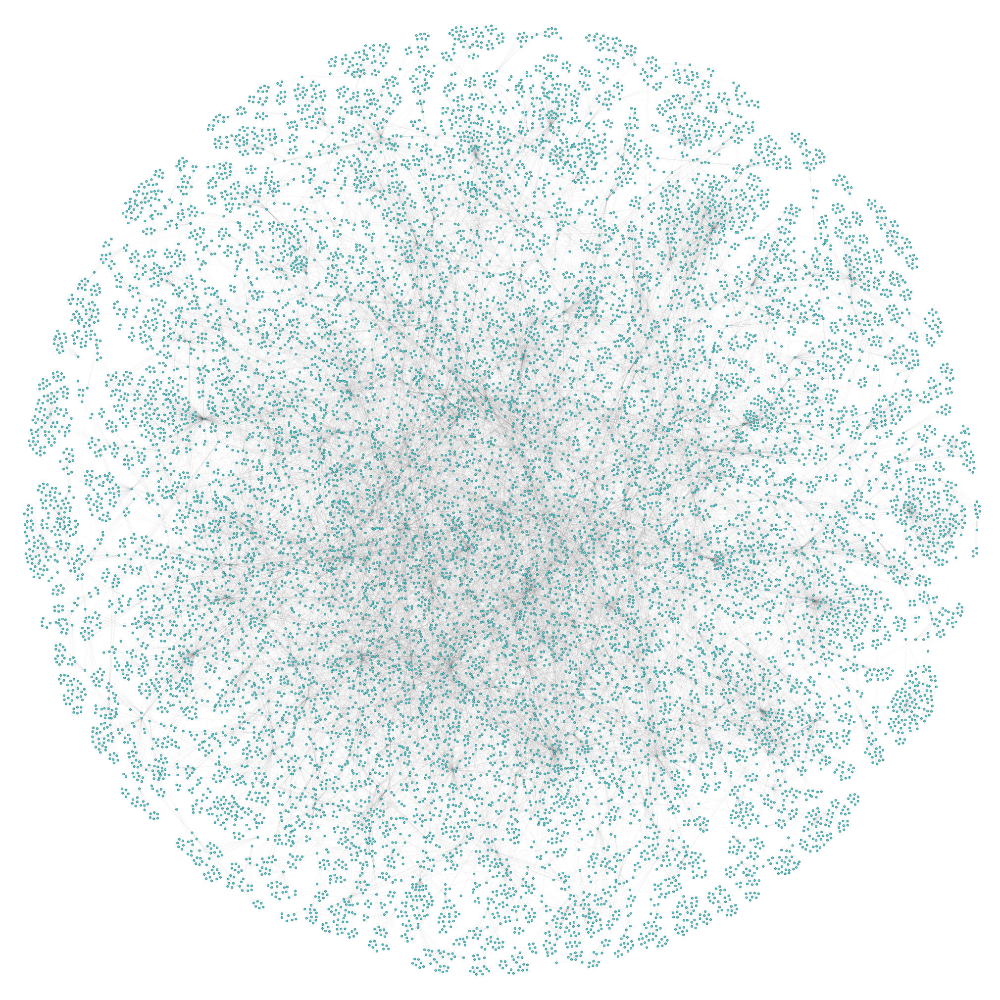

In [26]:
# Changing only the color of the nodes to ensure an unbiased representation og the networks
config_author_network = config_random_network.copy()
config_author_network.update({
    'node_fill_color': '#50d1c5',
    'node_stroke_color': '#2a7286'
    })

network, config_author_network = nw.visualize(largest_cc_coauthorship_network_subgraph, plot_in_cell_below=False, config=config_author_network)

fig, ax = nw.draw_netwulf(network, figsize=20)
plt.savefig("Coauthorship_network.pdf")

Both networks have been visualized using the Netwulf library and are displayed above. PDF's of the networks can be found in the 'Part 1 Network visualizations' folder for super high detail inspection. 

In addition to these visualizations, degree distributions are visualized as well.

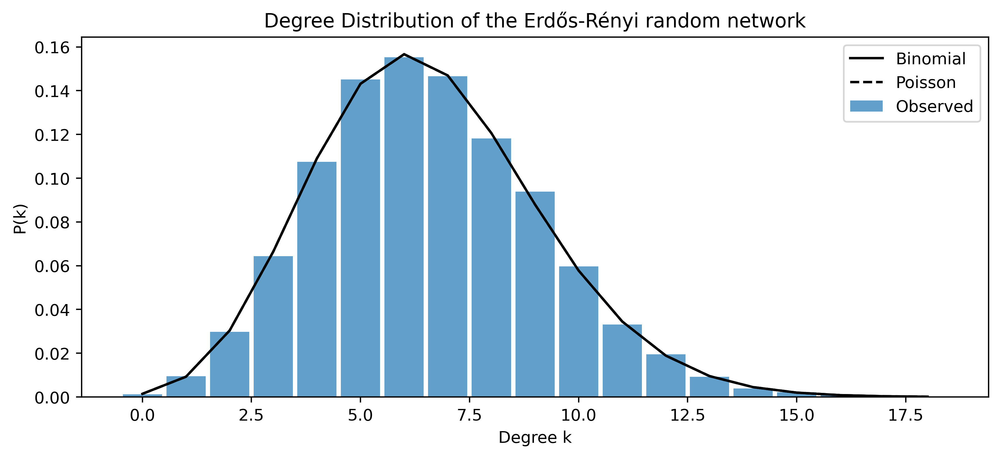

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import binom, poisson

def plot_degree_distribution(G, N, p):
    degrees = [d for n, d in G.degree()]
    hist, bins = np.histogram(degrees, bins=range(max(degrees)+2), density=True)

    plt.figure(figsize=(10, 4), dpi=400)
    plt.bar(bins[:-1], hist, width=0.9, alpha=0.7, label="Observed")
    
    # Binomial distribution
    k = np.arange(0, max(degrees) + 1)
    binom_dist = binom.pmf(k, N-1, p)
    plt.plot(k, binom_dist, 'k-', label="Binomial")
    
    # Poisson approximation
    lambda_ = p * (N - 1)
    poisson_dist = poisson.pmf(k, lambda_)
    plt.plot(k, poisson_dist, 'k--', label="Poisson")
    
    plt.xlabel("Degree k")
    plt.ylabel("P(k)")
    plt.legend()
    plt.title("Degree Distribution of the Erdős-Rényi random network")
    plt.show()

plot_degree_distribution(random_network, N, p)


We see that for the Erdős-Rényi random network, the degree distribution follows the theoretical binomial distribution very well.

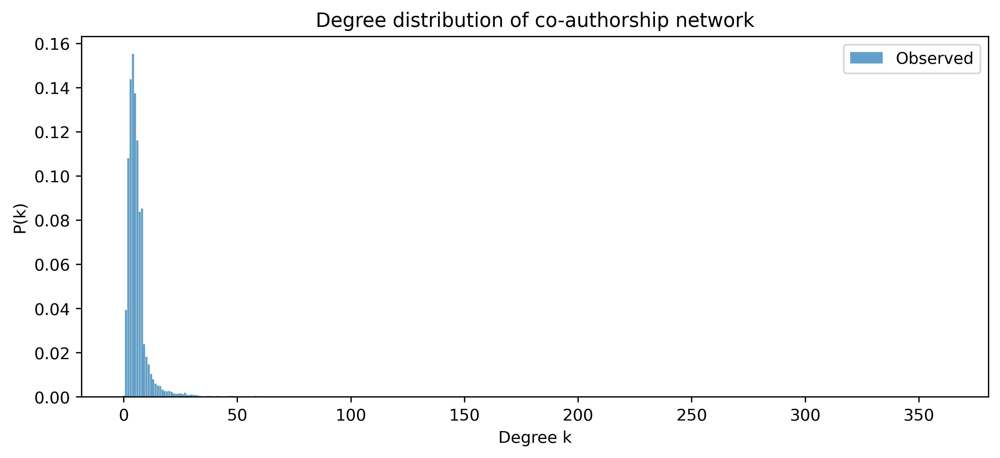

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from scipy.stats import binom, poisson

def plot_degree_distribution(G):
    degrees = [d for n, d in G.degree()]
    hist, bins = np.histogram(degrees, bins=range(max(degrees) + 2), density=True)
    
    plt.figure(figsize=(10, 4), dpi=400)
    plt.bar(bins[:-1], hist, width=0.9, alpha=0.7, label="Observed")
    
    N = G.number_of_nodes()
    L = G.number_of_edges()
    p = (2 * L) / (N * (N - 1)) 
    
    
    plt.xlabel("Degree k")
    plt.ylabel("P(k)")
    plt.legend()
    plt.title("Degree distribution of co-authorship network")
    plt.show()


plot_degree_distribution(coauthorship_network)


The real network seems to exhibit a Heavy-tailed distribution of degrees: there are few highly connected nodes (hubs). As we have learnt, we will plot this in log-log scale

Power-law exponent: 1.913


/var/folders/sb/z14jqgvs7ngc7n8kht8p2hpm0000gn/T/ipykernel_57820/3726992739.py:20: RuntimeWarning: divide by zero encountered in power
  plt.plot(unique_degrees, C * unique_degrees ** gamma, 'k-', label=r'Power law $P(k) \sim k^{-\gamma}$')


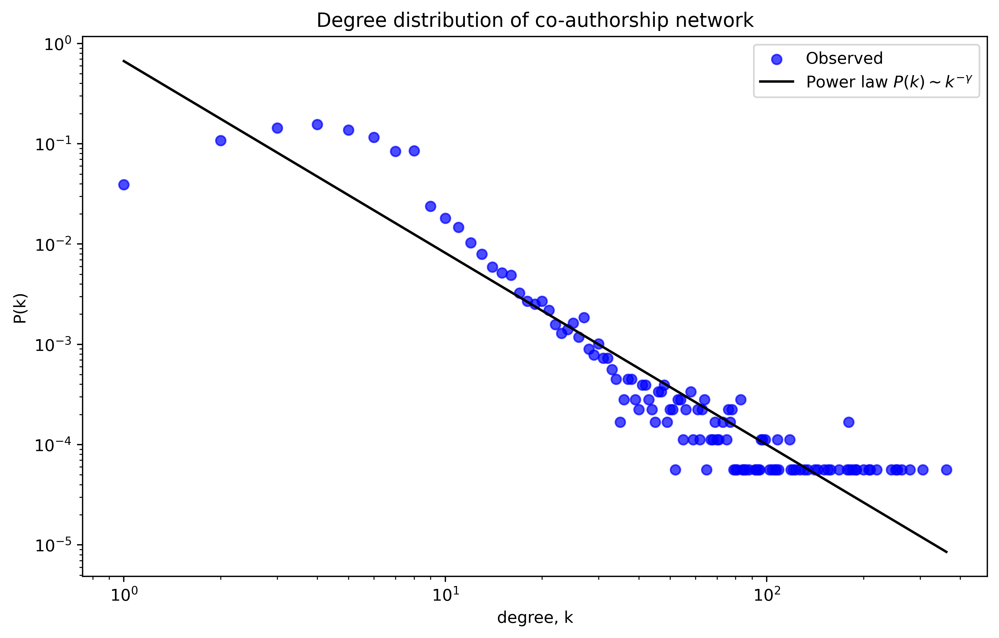

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx


def plot_degree_distribution(G):
    degrees = [d for _, d in G.degree()]
    unique_degrees, counts = np.unique(degrees, return_counts=True)
    prob = counts / counts.sum()
    
    plt.figure(figsize=(10, 6), dpi=400)
    plt.scatter(unique_degrees, prob, color='b', label='Observed', alpha=0.7)
    
    gamma, log_C = np.polyfit(np.log(unique_degrees[unique_degrees > 1]), 
                              np.log(prob[unique_degrees > 1]), 1)
    C = np.exp(log_C)
    
    print(f"Power-law exponent: {-gamma:.3f}")    

    plt.plot(unique_degrees, C * unique_degrees ** gamma, 'k-', label=r'Power law $P(k) \sim k^{-\gamma}$')
    
    plt.xscale("log")
    plt.yscale("log")
    plt.xlabel("degree, k")
    plt.ylabel("P(k)")
    plt.legend()
    plt.title("Degree distribution of co-authorship network")
    plt.show()



plot_degree_distribution(coauthorship_network)

Our Computational social scientist-network seems to follow the power-law correlation relative well, with a power-law exponent of 1.913, slightly below the typical 2-3 range for scale-free networks. This indicates our network has a heavy-tailed degree distribution, consistent with many real-world networks where most nodes have few connections while a small number of nodes have many connections.


* Answer the following questions __(max 200 words in total)__:

$\quad$ - What regime does your random network fall into? Is it above or below the critical threshold?

We calculate the average degree of a node in the network $\langle k\rangle$:

$$\langle k\rangle=\frac{2 \times 58544}{17833} \approx 6.57$$

Since $\langle k\rangle>1$, the network falls into the supercritical regime, and our network is above the critical threshold. In this regime, a giant component should emerge that contains a finite fraction of all nodes.

$\quad$ - According to the textbook, what does the network's structure resemble in this regime?

In this regime, a giant component forms, containing a significant fraction of all nodes. While most nodes are connected, some isolated nodes and small components still exist. 

Since $\ln 17833 \approx 9.79$ and $\langle k\rangle<\ln N$, the network is not fully connected-meaning that although a dominant cluster is present, some nodes remain in disconnected components. This aligns with our calculations from the visualization task.


$\quad$ - Based on your visualizations, identify the key differences between the actual and the random networks. Explain whether these differences are consistent with theoretical expectations.

The network visualizations show that the random network has a more even link distribution, as each node has the same probability of forming edges. In contrast, the coauthorship network has varying node degrees, resulting in a denser center and clearer patterns. The degree distribution plot supports this, with the random network likely following a binomial distribution, while the coauthorship network appears more heavy-tailed.










2. _Shortest Paths_: Here, we will check if the Computational Social Scientists Network exhibits characteristics of a small-world network by analyzing its shortest paths.


Begin by identifying the largest connected component within the Computational Social Scientists network. Recall that a connected component is a subset of nodes in which every pair of nodes is connected by a path. For a refresher on connected components, see section 2.9 of the Network Science book. Follow these steps:


- Utilize [``nx.algorithms.connected_components``](https://networkx.org/documentation/stable//reference/algorithms/generated/networkx.algorithms.components.connected_components.html) to enumerate all connected components, which will be returned as a list of node subsets.

In [30]:
connected_components = list(nx.connected_components(coauthorship_network))

The connected components are returned as a list of node subsets. Some key statistics are printed for control:

In [31]:
print(f'Number of components within the Computational Social Scientists network: {len(connected_components)}')
size_list = [len(component) for component in connected_components]
sorted_size_decending = sorted(size_list,reverse=True)
print(f'Sizes of each component (descending by size): {sorted_size_decending}')

Number of components within the Computational Social Scientists network: 211
Sizes of each component (descending by size): [15923, 63, 59, 45, 39, 34, 31, 31, 30, 30, 29, 26, 25, 23, 22, 21, 20, 20, 19, 19, 19, 19, 18, 18, 17, 17, 17, 17, 17, 16, 15, 15, 15, 15, 14, 14, 14, 13, 13, 13, 13, 13, 13, 13, 13, 12, 12, 12, 12, 12, 12, 12, 12, 12, 11, 11, 11, 11, 11, 11, 11, 11, 10, 10, 10, 10, 10, 10, 10, 10, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1]


- Select the largest subset of nodes identified in the previous step. Then, create a subgraph of your original network that includes only these nodes, using [``nx.Graph.subgraph``](https://networkx.org/documentation/stable/reference/classes/generated/networkx.Graph.subgraph.html). This subset forms your largest connected component, sometimes referred to as the [giant component](https://en.wikipedia.org/wiki/Giant_component).


We extract the largest connected component, which we found to be of size 15923.

In [32]:
largest_cc = max(connected_components, key=len)

giant_component = coauthorship_network.subgraph(largest_cc).copy()

print(giant_component) # size security check

Graph with 15923 nodes and 53832 edges


* Calculate the average (unweighted) shortest path length within this giant component by employing [``nx.average_shortest_path_length``](https://networkx.org/documentation/networkx-1.3/reference/generated/networkx.average_shortest_path_length.html).


In [33]:
average_shortest_path_length = nx.average_shortest_path_length(giant_component)
print(average_shortest_path_length)

5.950953386612338


The average unweighted shortest path length within the giant component is $\approx5.95$

* Perform the same calculation for the giant component of the random network you constructed in the above exercise 1.


In [34]:
connected_components_random= list(nx.connected_components(random_network))

print(f'Number of components within the random network: {len(connected_components_random)}')
size_list = [len(component) for component in connected_components_random]
sorted_size_decending = sorted(size_list,reverse=True)
print(f'Sizes of each component (decending by size): {sorted_size_decending}')

Number of components within the random network: 23
Sizes of each component (decending by size): [17811, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


In [35]:
largest_cc_random = max(connected_components_random, key=len)

giant_component_random = random_network.subgraph(largest_cc_random).copy()

print(giant_component_random)

Graph with 17811 nodes and 58750 edges


In [36]:
average_shortest_path_length_random = nx.average_shortest_path_length(giant_component_random)
print(average_shortest_path_length_random)

5.409868022496239


The average unweighted shortest path length within the giant component is $\approx5.41$ for the random network


* Reflect on how the average shortest path lengths of the real and random networks compare and answer the following questions, supporting your answers with the theory from the book.


From the book, we learned that while real-world and random networks differ in structure, they often exhibit similar average shortest path lengths. This observation holds in our case, where both networks have comparable average shortest path lengths (approximately 5.95 for the real network and 5.41 for the random network). This suggests that, despite structural differences, the efficiency of information flow in both networks remains similar.

- Why do you think I asked you to consider the giant component only?

By ensuring that we analyze only a fully connected subgraph where every node can reach every other node, we avoid the issue of disconnected components. If smaller, disconnected components were included, many pairs of nodes would be unreachable, resulting in an infinite shortest path length between them, making it impossible to compute a meaningful average shortest path length.



- Why do you think I asked you to consider unweighted edges?


We consider unweighted edges because we are focusing on the network's structural properties, such as connectivity and path length, rather than the strength or intensity of individual connections. In small-world networks, the key interest is in the number of steps needed to traverse the network, and the varying levels of interaction between nodes (e.g. authors) are less relevant to this measure.

- Does the Computational Social Scientists network exhibit the small-world phenomenon?

The small-world model, introduced by Watts and Strogatz in 1998, states that real-world networks tend to have:

1. Short average path lengths, similar to those of random networks.
2. High clustering coefficients, significantly greater than those observed in random networks.

To determine if the computational social scientist network exhibits the small-world property, we compare its clustering coefficient with that of a random network:

In [37]:
clustering_real = nx.average_clustering(giant_component)
clustering_random = nx.average_clustering(giant_component_random)
print(f'Clustering coefficient for the computational social scientist network:',clustering_real)
print(f'Clustering coefficient for the random network:',clustering_random)

Clustering coefficient for the computational social scientist network: 0.8222685388147903
Clustering coefficient for the random network: 0.00022217374043905565


Since the clustering coefficient is much greater for the computational social scientist network, but both networks have around the same average shortest path length, we conclude that the computational social scientist network exhibits the small-world phenomenon.

# `Part 2:` Network Analysis in Computational Social Science


In [7]:
import json
import numpy as np
import networkx as nx
from networkx.readwrite import json_graph
def read_json_file(filename):
    with open(filename) as f:
        js_graph = json.load(f)
    return json_graph.node_link_graph(js_graph)
G = read_json_file('authors_graph.json')

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/networkx/readwrite/json_graph/node_link.py:287: FutureWarning: 
The default value will be changed to `edges="edges" in NetworkX 3.6.

To make this warning go away, explicitly set the edges kwarg, e.g.:

  nx.node_link_graph(data, edges="links") to preserve current behavior, or
  nx.node_link_graph(data, edges="edges") for forward compatibility.
  warnings.warn(


> __Exercise 1: Mixing Patterns and Assortativity__ 
>
> __Part 1: Assortativity Coefficient__ 
> 1. *Calculate the Assortativity Coefficient* for the network based on the country of each node. Implement the calculation using the formula provided during the lecture, also available in [this paper](https://arxiv.org/pdf/cond-mat/0209450.pdf) (equation 2, here for directed networks). **Do not use the NetworkX implementation.**
>

### Writing a function for calculating assortativity

In [13]:
def assortative(G, attribute): 
    attr_values = {G.nodes[n][attribute] for n in G.nodes}
    attr_indices = {attr: i for i, attr in enumerate(attr_values)}
    n_att = len(attr_values)

    #initialize e matrix: 
    e = np.zeros([n_att, n_att])

    for u, v in G.edges:
        attr_u = G.nodes[u][attribute]
        attr_v = G.nodes[v][attribute]
        i, j = attr_indices[attr_u], attr_indices[attr_v]
        e[i, j] += 1

    #normalize e 
    e = e/G.number_of_edges()

    #Calculating assorsativity coefficient
    a = e.sum(axis=0)
    b = e.sum(axis=1)
    eii = np.trace(e)
    sum_ab = np.sum(a*b)
    r = (eii - sum_ab)/(1-sum_ab) 
    return r

print("Assortativity for our network based on 'country': ", assortative(G, "country"))

Assortativity for our network based on 'country':  0.39311489422905876


> __Part 2: Configuration model__
> In the following, we are going to assess the significance of the assortativity by comparing the network's assortativity coefficient against that of random networks generated through the configuration model.  
>
> 2. *Implement the configuration model* using the _double edge swap_ algorithm to generate random networks. Ensure each node retains its original degree but with altered connections. Create a function that does that by following these steps:
>   - **a.** Create an exact copy of your original network.
>   - **b.** Select two edges, $e_{1} = (u,v)$ and $e_{2} = (x,y)$, ensuring *u != y* and *v != x*.
>   - **c.** Flip the direction of $e_{1}$ to $e_{1} = (v,u)$ 50% of the time. This ensure that your final results is not biased, in case your edges were sorted (they usually are). 
>   - **d.** Ensure that new edges $e_{1}' = (e_{1}[0],e_{2}[1])$ and $e_{2}' = (e_{2}[0],e_{1}[1])$ do not already exist in the network.
>   - **e.** Remove edges $e_{1}$ and $e_{2}$ and add edges $e_{1}'$ and $e_{2}'$.
>   - **f.** Repeat steps **b** to **e** until you have performed _E*10_ swaps, where E is the total number of edges.


### Implementing a function for the double edge swap algorithm - and a parallel function

In [14]:
import random as rnd
from tqdm import tqdm
from multiprocessing import get_context

def double_egde_swap(original_G): 
    G2 = original_G.copy()
    edges = set(G2.edges())

    for i in tqdm(range(len(edges)*10)): 
        swap_successful = False
        while not swap_successful: 
            e1,e2 = rnd.sample(list(edges), 2)
            if e1[0] != e2[1] and e1[1] != e2[0] and e1[0] != e2[0] and e1[1] != e2[1]: 
                old_e1 = e1
                if rnd.random() >0.5: 
                    e1 = (e1[1], e1[0])
                
                e11 = (e1[0], e2[1])
                e22 = (e2[0], e1[1])
                if (e11 not in G2.edges()) and (e22 not in G2.edges()) and ( e11[0] != e11[1] or e22[0] != e22[1]): 
                    #update egdes set
                    edges.remove(old_e1)
                    edges.remove(e2)
                    edges.add(e11)
                    edges.add(e22)

                    #Remove old egdes and Add new egdes
                    G2.remove_edges_from([old_e1,e2])
                    G2.add_edges_from([e11,e22])
        
                    swap_successful = True

    return G2

def parallel(G):
    p = get_context("fork").Pool(8)
    results = p.map(double_egde_swap, [G for _ in range(8)])
    p.close()
    return results

> 3. *Double check that your algorithm works well*, by showing that the degree of nodes in the original network and the new 'randomized' version of the network are the same.
>
>

In [19]:
G2 = double_egde_swap(G)
orig_degrees = dict(G.degree())
new_degrees = dict(G2.degree())

print("Checking degree count")
print(sum(dict(G2.degree).values()))
print(sum(dict(G.degree).values()))

print("")
print("Checking if degrees are preserved for each node")
# Check if degrees are preserved for every node
degree_preserved = all(orig_degrees[n] == new_degrees[n] for n in G.nodes())
degree_preserved

Checking degree count
115864
115864

Checking if degrees are preserved for each node


True

> __Part 3: Analyzing Assortativity in Random Networks__  
>
> 4. *Generate and analyze at least 100 random networks* using the configuration model. For each, calculate the assortativity with respect to the country and plot the distribution of these values. Compare the results with the assortativity of your original network to determine if connections within the same country are significantly higher than chance.
>

### Running the double egde swap algorithm in parallel 13 times, to get 104 random graphs. 

In [ ]:
res = []
for i in range(13): 
    res += parallel(G)
    print(i)
res

In [21]:
assort = [assortative(g, 'country') for g in res]

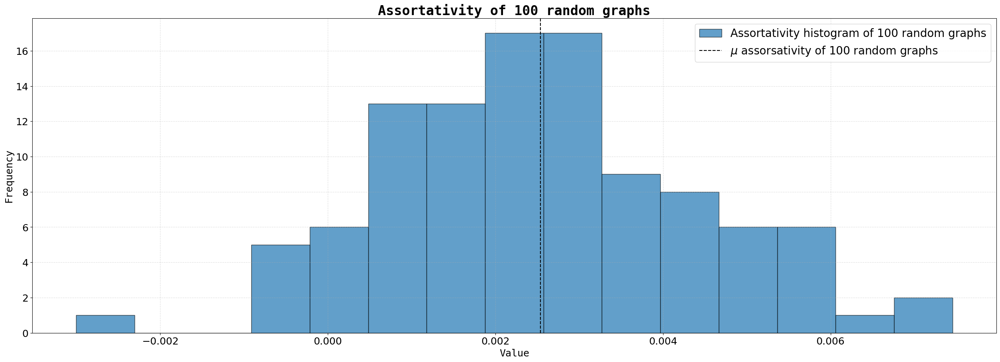

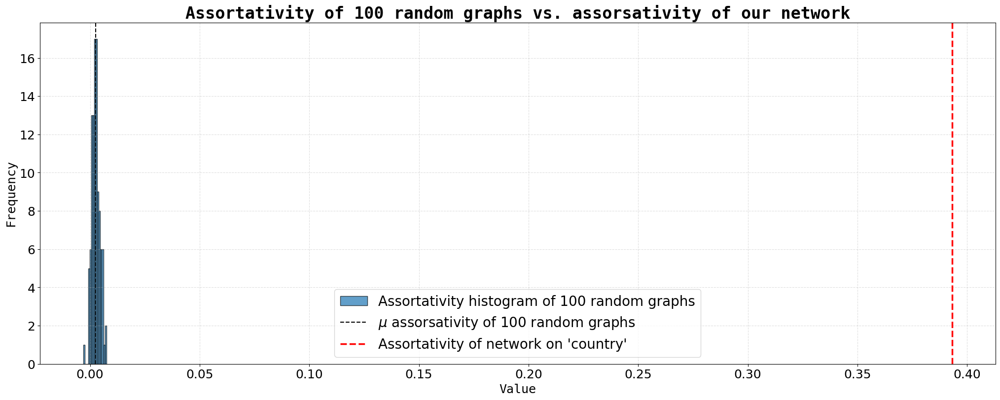

In [25]:
import numpy as np
import matplotlib.pyplot as plt
# Define number of bins
num_bins = 15

plt.figure(figsize=(25,9),  constrained_layout=True)
plt.hist(assort, bins=num_bins, edgecolor='black', alpha=0.7, label="Assortativity histogram of 100 random graphs")
plt.xlabel('Value',  fontname="monospace", fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.axvline(np.mean(assort), color="black", linestyle='--', label=r'$\mu$ assorsativity of 100 random graphs')
plt.ylabel('Frequency',  fontname="monospace", fontsize=18)
plt.title('Assortativity of 100 random graphs', fontsize=24, fontname="monospace", fontweight='bold') #plt.title("Accuracy of Entropy and Random", fontsize=16, fontname="monospace", fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(fontsize=20)
plt.show()

# Plot histogram
plt.figure(figsize=(25,9))
plt.hist(assort, bins=num_bins, edgecolor='black', alpha=0.7, label="Assortativity histogram of 100 random graphs")
plt.xlabel('Value',  fontname="monospace", fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.axvline(np.mean(assort), color="black", linestyle='--', label=r'$\mu$ assorsativity of 100 random graphs')
plt.axvline(assortative(G,"country"), color="red", linestyle="--", label="Assortativity of network on 'country' ", linewidth=2.5)
plt.ylabel('Frequency',  fontname="monospace", fontsize=18)
plt.title('Assortativity of 100 random graphs vs. assorsativity of our network', fontsize=24, fontname="monospace", fontweight='bold') #plt.title("Accuracy of Entropy and Random", fontsize=16, fontname="monospace", fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(fontsize=20)
plt.show()

The assortativity of our network is significantly higher than that of the 100 random networks generated. The histogram shows that the assortativity values are cenetered around zero, while our assortativity - the red dashed line, is far beyond this range. This deviation indicates that nodes from the same country are far more likely to be connected than what we would expect by chance, confirming that assortativity based on country is a significant feature of our network. 

> 1. Visualize the graph. Set the color of each node based on the club split (the information is stored as a node attribute). My version of the visualization is below.
>

Set of unique clubs:  {'Mr. Hi', 'Officer'}


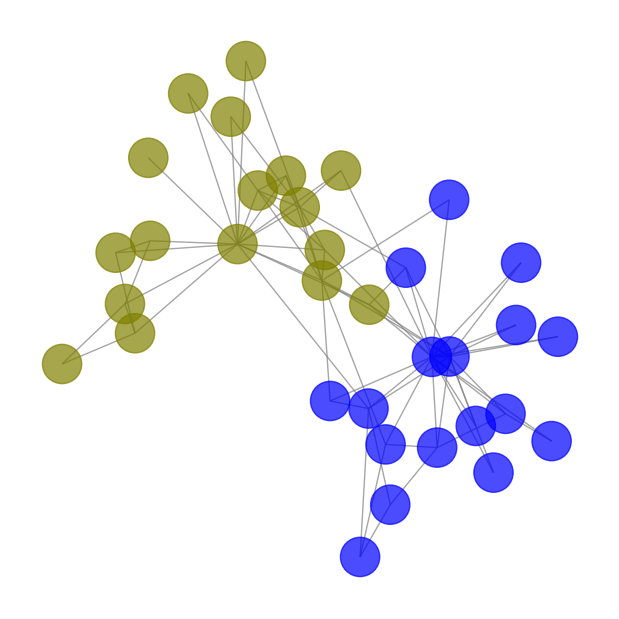

In [32]:
K = nx.karate_club_graph()
# Extract node attribute values
groups = nx.get_node_attributes(K, "club")
print("Set of unique clubs: ",set(groups.values()))

#Assigning a color to each club
mapp = {"Officer": "blue", "Mr. Hi": "olive"}

#Mapping clubs to colors
colors = [mapp[groups[n]] for n in K.nodes()] 

plt.figure(figsize=(6, 6))
nx.draw(K, node_color=colors, node_size=800, edge_color="gray", alpha=0.7)

plt.show()

> 2. Write a function to compute the __modularity__ of a graph partitioning (use **equation 9.12** in the book). The function should take a networkX Graph and a partitioning as inputs and return the modularity.

In [33]:
def modularity(G, partition):
    L = len(G.edges())
    M = 0 
    for par in partition: 
        Lc = sum([1 for u, v in G.edges() if u in par and v in par])
        kc = sum([nx.degree(G,n) for n in par])
        modularity = Lc/L -(kc/(2*L))**2
        M += modularity
    
    return M

Modularity is a measure of how well a network is partitioned into communities by comparing the actual number of edges within groups to the expected number in a randomly structured network with the same degree distribution. It is defined as the difference between the fraction of edges within communities and the fraction expected by chance. 

A positive modularity value indicates that a partition has more internal edges than expected, suggesting a strong community structure. A value close to zero suggests that edges are distributed similarly to a random network, implying little to no meaningful community structure. Negative values indicate that the partitioning is worse than expected, meaning that nodes within communities are less connected than expected.

> 4. Compute the modularity of the Karate club split partitioning using the function you just wrote. Note: the Karate club split partitioning is avilable as a [node attribute](https://networkx.org/documentation/networkx-1.10/reference/generated/networkx.classes.function.get_node_attributes.html), called _"club"_.

In [34]:
#partitioning the graph
mrhi = set([val for val, key in nx.get_node_attributes(K, "club").items() if key == "Mr. Hi"])
officer = set([val for val, key in nx.get_node_attributes(K, "club").items() if key == "Officer"])
partition_clubs = [mrhi, officer] 
mod_k = modularity(K, partition_clubs)

print("Partitioning: ")
print(partition_clubs)
print("")
print("Modularity of K:",mod_k)

Partitioning: 
[{0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 16, 17, 19, 21}, {32, 33, 9, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31}]

Modularity of K: 0.3582347140039447


> 5. Create $1000$ randomized version of the Karate Club network using the _double edge swap_ algorithm you wrote in the exercise above 5. For each of them, compute the modularity of the "club" split and store it in a list.

In [ ]:
karate_networks = []
for i in range(126): 
    karate_networks += parallel(K)
    print(i)

In [36]:
mods = []
for g in karate_networks:
    mrhi = set([val for val, key in nx.get_node_attributes(K, "club").items() if key == "Mr. Hi"])
    officer = set([val for val, key in nx.get_node_attributes(K, "club").items() if key == "Officer"])
    partition = [mrhi, officer] 
    mods.append(modularity(g, partition))

> 6. Compute the average and standard deviation of the modularity for the random network.

In [37]:
mean = np.mean(mods)
std = np.std(mods)
print(f"Mean: {mean}, Std: {std}")

Mean: -0.01859678782755712, Std: 0.04808612815728154


> 7. Plot the distribution of the "random" modularity. Plot the actual modularity of the club split as a vertical line (use [axvline](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.axvline.html)).

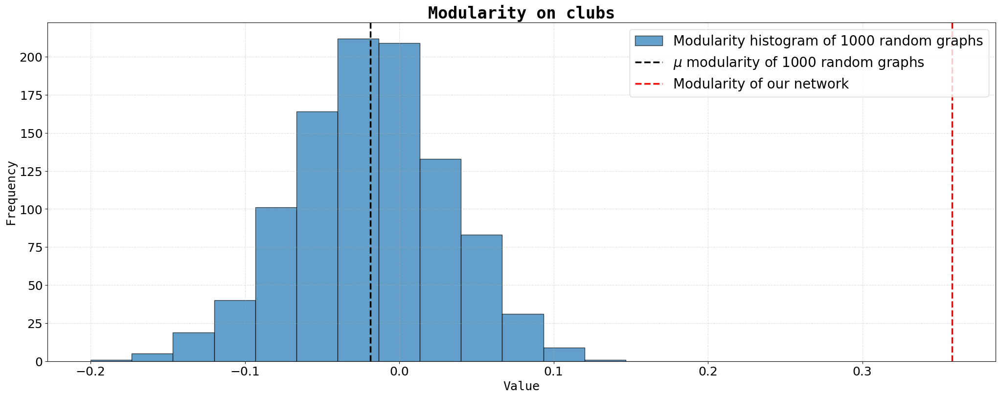

In [40]:
num_bins = 15

plt.figure(figsize=(25,9))
plt.hist(mods, bins=num_bins, range=(-0.2,0.2),edgecolor='black', alpha=0.7, label="Modularity histogram of 1000 random graphs")
plt.xlabel('Value',  fontname="monospace", fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.axvline(np.mean(mods), color="black", linestyle='--', label=r'$\mu$ modularity of 1000 random graphs', linewidth=2.5)
plt.axvline(mod_k, color="red", linestyle="--", label="Modularity of our network", linewidth=2.5)
plt.ylabel('Frequency',  fontname="monospace", fontsize=18)
plt.title('Modularity on clubs', fontsize=24, fontname="monospace", fontweight='bold') #plt.title("Accuracy of Entropy and Random", fontsize=16, fontname="monospace", fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(fontsize=20)
plt.show()

> 8. Comment on the figure. Is the club split a good partitioning? Why do you think I asked you to perform a randomization experiment? What is the reason why we preserved the nodes degree?

The modularity values for the 1000 randomized networks are approximately symmetrically distributed around zero, which aligns with theoretical expectations. Since modularity measures how well a partition differs from a random baseline, shuffling edges while preserving node degrees results in modularity values close to zero—confirming that the randomized networks lack meaningful community structure.

The red dashed line represents the modularity of the actual club split, which is significantly higher than any of the random networks. This indicates that the club partitioning is far from random and captures strong underlying community structure.

This randomization experiment serves as a sanity check for the modularity computation and ensures that our results are meaningful. Additionally, preserving node degrees in the double edge swap is crucial. Without it, the randomized networks would have a different degree distribution, making the comparison invalid.

> 9.  Use [the Python Louvain-algorithm implementation](https://anaconda.org/auto/python-louvain) to find communities in this graph. Report the value of modularity found by the algorithm. Is it higher or lower than what you found above for the club split? What does this comparison reveal?

### Calling the networkx community to use the louvain algorithm

In [41]:
partition_lou = nx.community.louvain_communities(K, seed=14)
partition_lou

[{4, 5, 6, 10, 16},
 {0, 1, 2, 3, 7, 11, 12, 13, 17, 19, 21},
 {8, 9, 14, 15, 18, 20, 22, 26, 29, 30, 32, 33},
 {23, 24, 25, 27, 28, 31}]

### Plotting the network for visuals

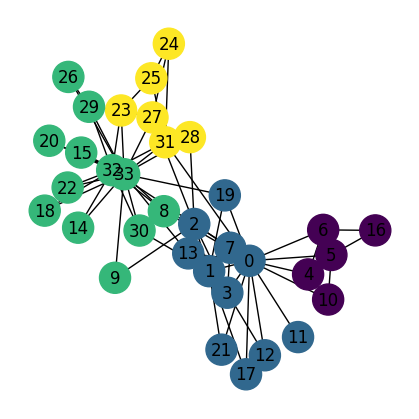

Modularity


0.41978961209730437

In [46]:
mapp = {}
for idx, p in enumerate(partition_lou): 
    for n in p: 
        mapp[n] = idx

colors = [mapp[n] for n in K.nodes()] 

plt.figure(figsize=(4, 4))
nx.draw(K, with_labels=True ,node_color=colors, node_size=500, edge_color="black")

plt.show()
print("Modularity")
modularity(K, partition_lou)

Using the louvain algorithm we obtain a higher modularity than partitioning the graph on the node attribute clubs. This reveals there is a partition of the karate graph, where the communities are more connected, than when partitioning on "clubs". 

> 10.  Compare the communities found by the Louvain algorithm with the club split partitioning by creating a matrix **_D_** with dimension (2 times _A_), where _A_ is the number of communities found by Louvain. We set entry _D_(_i_,_j_) to be the number of nodes that community _i_ has in common with group split _j_. The matrix **_D_** is what we call a [**confusion matrix**](https://en.wikipedia.org/wiki/Confusion_matrix). Use the confusion matrix to explain how well the communities you've detected correspond to the club split partitioning.

In [43]:
D = np.zeros((len(partition_clubs), len(partition_lou)), dtype=int)
for node in K.nodes(): 
    lou_com = [idx for idx, c in enumerate(partition_lou) if node in c][0]
    club_com = [idx for idx, c in enumerate(partition_clubs) if node in c][0]
    D[club_com, lou_com] += 1

print("Confusion Matrix D:")
print(D)

Confusion Matrix D:
[[ 5 11  1  0]
 [ 0  0 11  6]]


The first row corresponds to Club 1 "Mr. Hi", and the second row Club 2 "Officer". This shows that the louvian algorithm generally agrees with the club partitioning, keeping mainly Club 1 into partition 1 and 2, and Club 2 into partition 3 and 4. This in combination with a higher modularity reveals that the algorithm is able to detect finer community structures within the two clubs.

# `Part 3:` Words that characterize Computational Social Science communities

## Exercise 1

 TF-IDF and the Computational Social Science communities. The goal for this exercise is to find the words charachterizing each of the communities of Computational Social Scientists. What you need for this exercise:

* The assignment of each author to their network community, and the degree of each author (Week 6, Exercise 4). This can be stored in a dataframe or in two dictionaries, as you prefer.

* the tokenized abstract dataframe (Week 7, Exercise 2)


## From Week 6, Exercise 4.

In this section the retrieval of the following is found.

NOTE: As this is preliminary for the actual project not much commenting is done...

**The assignment of each author to their network community, and the degree of each author (Week 6, Exercise 4). This can be stored in a dataframe or in two dictionaries, as you prefer.**


In [1]:
import pandas as pd
from collections import defaultdict
import community as community_louvain
import ast
import networkx as nx

In [2]:
papers_df = pd.read_csv("final_paperdata.csv")
authors_df = pd.read_csv("final_authors.csv")
final_abstracts_df = pd.read_csv("final_abstractdata.csv")

In [3]:
coauthor_counts = defaultdict(int)

all_author_ids = set()
for author_list in papers_df['author_ids'].dropna():
    authors = ast.literal_eval(author_list)
    all_author_ids.update(authors)

    
    for i in range(len(authors)):
        for j in range(i + 1, len(authors)):
            coauthor_counts[(authors[i], authors[j])] += 1

weighted_edgelist = [(a, b, w) for (a, b), w in coauthor_counts.items()]

G = nx.Graph()
G.add_nodes_from(all_author_ids)
G.add_weighted_edges_from(weighted_edgelist)
print(G)

Graph with 17833 nodes and 58544 edges


In [4]:
degrees_dict = dict(G.degree())
author_to_community_dict = community_louvain.best_partition(G)

In [5]:
import pandas as pd

author_community_df = pd.DataFrame({
    "author_id": list(author_to_community_dict.keys()),
    "community": list(author_to_community_dict.values()),
    "degree": [degrees_dict[a] for a in author_to_community_dict.keys()]
})

author_community_df.to_csv("author_community_assignments.csv", index=False)


## From Week 7, Exercise 2

In this section the retrieval of the following is found.

NOTE: As this is preliminary for the actual project not much commenting is done...

**the tokenized abstract dataframe (Week 7, Exercise 2)**

In [6]:
import numpy as np

def inverted_index_to_text(inverted_index_str):
    if pd.isna(inverted_index_str):
        return ""
    
    inverted_index = ast.literal_eval(inverted_index_str) # convert to dictionary from string
    
    if not inverted_index:
        return ""
    
    all_positions = list(inverted_index.values())
    if not all_positions:
        return ""
    
    max_idx = max(np.concatenate(list(inverted_index.values()), axis=0))
    abs_list = np.empty(max_idx + 1, dtype="object")

    for key, values in inverted_index.items(): 
        abs_list[values] = key
        
    abs_list = [x for x in abs_list if x is not None]
    return (" ").join(abs_list)

final_abstracts_df["text"] = final_abstracts_df["abstract_inverted"].apply(inverted_index_to_text)

In [7]:
final_abstracts_df[:3]

,Unnamed: 0,id,title,abstract_inverted,text
0,0,https://openalex.org/W2887260263,Social robots for education: A review,"{'A': [0], 'review': [1], 'of': [2], 'social':...",A review of social robots in education discuss...
1,1,https://openalex.org/W2009639618,Optimal decision making and the anterior cingu...,NaN,
2,2,https://openalex.org/W2107911338,Robots for Use in Autism Research,"{'Autism': [0], 'spectrum': [1], 'disorders': ...",Autism spectrum disorders are a group of lifel...


In [8]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\teisa\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [9]:
from nltk.corpus import stopwords
import re
from nltk.stem import SnowballStemmer

stemmer = SnowballStemmer("english")
stop_words = set(stopwords.words("english"))

def tokenizer(text):
    text = text.lower()
    words = re.findall(r'[a-zA-Z]+', text)
    return [stemmer.stem(word) for word in words if word not in stop_words]


In [10]:
final_abstracts_df["tokens"] = final_abstracts_df["text"].apply(tokenizer)

In [11]:
from nltk.collocations import BigramCollocationFinder
from nltk.metrics import BigramAssocMeasures
from scipy.stats import chi2
from nltk.tokenize import MWETokenizer

all_tokens = [token for tokens in final_abstracts_df["tokens"] for token in tokens]

finder = BigramCollocationFinder.from_words(all_tokens)
finder.apply_freq_filter(51)

bigram_measures = BigramAssocMeasures()
scored = finder.score_ngrams(bigram_measures.chi_sq)

collocations = []
for bigram, score in scored:
    p_value = chi2.sf(score, df=1)
    if p_value < 0.001:
        collocations.append(bigram)

mwe_tokenizer = MWETokenizer(collocations, separator="_")

def retokenize(tokens):
    return mwe_tokenizer.tokenize(tokens)

final_abstracts_df["tokens"] = final_abstracts_df["tokens"].apply(retokenize)

In [12]:
final_abstracts_df[:3]

,Unnamed: 0,id,title,abstract_inverted,text,tokens
0,0,https://openalex.org/W2887260263,Social robots for education: A review,"{'A': [0], 'review': [1], 'of': [2], 'social':...",A review of social robots in education discuss...,"[review, social_robot, educ, discuss, expect_o..."
1,1,https://openalex.org/W2009639618,Optimal decision making and the anterior cingu...,NaN,,[]
2,2,https://openalex.org/W2107911338,Robots for Use in Autism Research,"{'Autism': [0], 'spectrum': [1], 'disorders': ...",Autism spectrum disorders are a group of lifel...,"[autism_spectrum, disord, group, lifelong, dis..."


## Exercise 1.1

**Description**: First, check out the wikipedia page for TF-IDF. Explain in your own words the point of TF-IDF.
https://en.wikipedia.org/wiki/Tf%E2%80%93idf

* What does TF stand for?
* What does IDF stand for?

**Solution**:

**Term frequency (TF)**.

TF calculates the fraction of a term in a document.

$$TF(t,d) = \frac{f_{t,d}}{\sum_{t' \in d}(f_{t',d})}$$

where $f_{t,d}$ is the count of term $t$ in document $d$.

Essentially TF behaves as an internal measure of relevancy for a term in a document. However, an obvious drawback of this meassure on its own is that some words in generel appear more often than other words and may be less informative and relevant to a document than other words. Consider the words "and", "the", "is", "of", "in". These terms will often be less informative and occur generally more in a corpus than say: "climate", "sports" or "algorithms". 

This is where the **inverse document frequency (IDF)** comes to play and essentially weighs terms to the entire corpus.

IDF is calculated as

$$
\text{IDF}(t, d) = \log \left( \frac{N}{\left| \left\{ d \in D \mid t \in d \right\} \right|} \right)
$$

where N is the count of documents in the entire corpus. and $ \left\{ d \in D \mid t \in d \right\} $ is the set of documents containing term t. $\left| \left\{ d \in D \mid t \in d \right\} \right|$ is then the count of documents containing the term t. Summarized IDF returns the log inverse fraction of documents containing the term t in the corpus D.

Using the logarithm in the IDF calculation smooths the impact of very rare terms, preventing them from being overemphasized simply because they appear in only a few documents. This ensures that rare words are still weighted more heavily than common ones, but not disproportionately.

IDF remedies some of the issues of TF and it proves to be a good complementary to TF.

Combined as the product of the two they give the TF-IDF

$$TFIDF(t,d,D) = tf(t,d)\cdot idf(t,D)$$

This function combines a terms importance within a single document (its internal representation) with its overall significance across the corpus.

## Exercise 1.2 
**Description**: Now, we want to find out which words are important for each community, so we're going to create several **large documents, one for each community**. Each document includes all the tokens of abstracts written by members of a given community.

* Consider a community c

* Find all the abstracts of papers written by a member of community c.

* Create a long array that stores all the abstract tokens

* Repeat for all the communities

**Note**: Here, to ensure your code is efficient, you shall exploit pandas builtin functions, such as groupby.apply or explode. 3. Now, we're ready to calculate the TF for each word. Use the method of your choice to find the top 5 terms within the top 5 communities (by number of authors).

**Solution**:

First and foremost the structure of the relevant dictionaries are rediscovered

In [13]:
list(degrees_dict.items())[:2]

[('https://openalex.org/A5083813378', 4),
 ('https://openalex.org/A5073348089', 1)]

In [14]:
list(author_to_community_dict.items())[:2]

[('https://openalex.org/A5083813378', 0),
 ('https://openalex.org/A5073348089', 1)]

The algorithm for gathering array of abstract tokens for each community is executed.

In [15]:
from tqdm import tqdm
tqdm.pandas()

papers_expanded = papers_df.copy() # Copy of the original papers_df so we dont make a mess inside it.
papers_expanded["author_ids"] = papers_expanded["author_ids"].apply(ast.literal_eval) # Parse the list containing author 
# ids such we can pd.explode
papers_expanded = papers_expanded.explode("author_ids") # explode pandas by author_ids get one row pr. author pr. paper.
papers_expanded["community"] = papers_expanded["author_ids"].map(author_to_community_dict) # Map each author 
# (now author_ids is just author) to their community
papers_expanded = papers_expanded.dropna(subset=["community"]) # Drop papers with authors that are not found to be in community.
# Should not be an issue but for safety.

print(f"{len(papers_expanded)} pairs after explosion and dropping.")

papers_expanded_with_tokens = papers_expanded.merge(final_abstracts_df[["id", "tokens"]], on="id", how="left") # Merge onto parpes_expanded
# (therefore how="left") by paper ids.

papers_expanded_with_tokens_unqiue = papers_expanded_with_tokens.drop_duplicates(subset=["id", "community"]) # Remove duplicates of 
# Community + paper, such that we dont count the same paper in a community multiple times.

print(f"{len(papers_expanded_with_tokens_unqiue)} unqiue paper and community pairs.")

grouped_by_community = papers_expanded_with_tokens_unqiue.groupby("community") # use groupby to get all papers grouped by community 

print(f"{len(grouped_by_community)} communities.")

community_abstracts = grouped_by_community["tokens"].progress_apply(lambda series: sum(series, [])).reset_index()
# Finally sum all tokens into one array pr. community.
# Use tqdm to track progress
# reset_index such that the pandas dataframe is formatted properly with columns (comunity, token)

215377 pairs after explosion and dropping.
168060 unqiue paper and community pairs.
302 communities.


100%|██████████| 302/302 [04:57<00:00,  1.01it/s] 


In [16]:
community_abstracts["tokens_length"] = community_abstracts["tokens"].apply(lambda tokens : len(tokens)) 
# apply column showing tokken length to get an idea of sizes.

In [17]:
community_abstracts

,community,tokens,tokens_length
0,0,"[observ, social_partner, primat, learn, reward...",214437
1,1,"[effici, recogn, function, circuit, key, mani_...",28800
2,2,"[paper_use, self_pace, read, test, process, pr...",84517
3,3,"[relat, pollut, birth, outcom, matern, exposur...",662732
4,4,"[idiopath, environment, intoler, iei, also_kno...",320507
...,...,...,...
297,297,"[localis, move, transceiv, free, object, addre...",370
298,298,"[context, patient, consum_health, inform_chang...",6261
299,299,"[geospati, data, constitut, consider, part, se...",529
300,300,"[present_work, effect, coolant, inject, tip, l...",327


**Finding the top 5 terms for the top 5 communities using TF**

In [18]:
from collections import Counter

community_counts = Counter(author_to_community_dict.values()) # get the counts of each author and community pair

sorted_communities_by_counts = sorted(community_counts.items(), key=lambda x: x[1], reverse=True) # sort in descending by count.

sorted_communities_by_counts[:5] # get first 5.

[(3, 948), (10, 614), (42, 597), (12, 593), (5, 551)]

The top 5 communities are found to be in the following array.

In [31]:
top_5_community_ids = np.array([id_and_count[0] for id_and_count in sorted_communities_by_counts[:5]])

print(f"Found the top 5 community ids as {top_5_community_ids}")

Found the top 5 community ids as [ 3 10 42 12  5]


Getting the TF for each word and then retrieving the top 5 terms within the top 5 communities:

In [22]:
top_5_communities = community_abstracts[community_abstracts["community"].isin(top_5_community_ids)]

top_5_communities

,community,tokens,tokens_length
3,3,"[relat, pollut, birth, outcom, matern, exposur...",662732
5,5,"[abstract, mental, lexicon, complex_cognit, sy...",285217
10,10,"[abstract_background, evid_suggest, decis, con...",467764
12,12,"[communiti_detect, fundament_task, social_netw...",315526
42,42,"[electron_medic, record, emr, enabl_technolog,...",382869


Apply TF to each term for each document.

In [23]:
top_5_communities_expanded = top_5_communities.copy() # Copy top 5 communities to not make a mess
exploded = top_5_communities_expanded.explode("tokens") # Explode into tokens

token_counts  = exploded.groupby(["community", "tokens"]).size().reset_index(name="count")
# group inside each community and get the token count store it in column "count"

total_tokens = exploded.groupby("community").size().reset_index(name="total")
# Group only by community such we can get the total counts

tf_df = token_counts.merge(total_tokens, on="community") # Merge total_tokens onto token_counts so we can divide after and get the TF

tf_df["TF"] = tf_df["count"] / tf_df["total"]

tf_df

,community,tokens,count,total,TF
0,3,aaa,1,662732,0.000002
1,3,aaai,4,662732,0.000006
2,3,aactran,3,662732,0.000005
3,3,aae,3,662732,0.000005
4,3,aal,9,662732,0.000014
...,...,...,...,...,...
165143,42,zuji,1,382869,0.000003
165144,42,zurfer,2,382869,0.000005
165145,42,zuyev,1,382869,0.000003
165146,42,zuylen,1,382869,0.000003


Extract top 5 terms for the top 5 communities

In [24]:
sorted_descending_by_tf = tf_df.sort_values(["TF"], ascending=[False]) # Sort it decending order by TF such term with highest TF is up.
top_5_per_community = sorted_descending_by_tf.groupby("community").head(5).reset_index()
# Grouping by community to then get the 5 largest by .head(5) as they are sorted descendingly. Finnaly reshaping back using reset_index.

top_5_per_community_sorted = top_5_per_community.sort_values(["community"]) # sort such we get the terms 
# for each community next to each other. Easier when printing

print(f"{len(top_5_per_community_sorted)} terms")

for i in range(0,25,5):
    print(f"Community: {top_5_per_community_sorted.iloc[i]["community"]}, 5 Terms: {top_5_per_community_sorted[i: i+5]["tokens"].to_list()}")


25 terms
Community: 3, 5 Terms: ['use', 'model', 'set', 'show', 'algorithm']
Community: 5, 5 Terms: ['data', 'model', 'use', 'system', 'base']
Community: 10, 5 Terms: ['differ', 'process', 'effect', 'use', 'model']
Community: 12, 5 Terms: ['user', 'network', 'use', 'model', 'system']
Community: 42, 5 Terms: ['user', 'design', 'use', 'system', 'interact']


* Describe similarities and differences between the communities.

When looking across the different communities they seem to have quite the similar tokens. Looking at tokens such as 'use', 'user', 'system', 'model' they are showing up in many of the different communities. Besides that the different communities do seem to have some tokens that are more unique to its group. But the massive showing of word 'use' and 'model' highlights that the communities are very similar when studying them using TF.

* Why aren't the TFs not necessarily a good description of the communities?

When describing the communities it might be of interest to discover differences between them. Therefore, one should account for tokens that generelly appear more often than others in the studied corpus. As seen 'use' and 'model' are very popular tokens, which are being presented in 5/5 and 4/5 of the different communities within the top 5 using TF. This highlights why TF might not necessarily be good at describing the communities when interested in differences.


* Next, we calculate IDF for every word.

In [25]:
community_abstracts_expanded = community_abstracts.copy() # Copy the community abstracts to not make a mess
exploded = community_abstracts_expanded.explode("tokens") # Explode into tokens

print(f"{len(exploded)} tokens...")

community_token_pairs = exploded[["community", "tokens"]].drop_duplicates() 
# Removing all duplicates as we just need to know if community i has token j.

token_to_community_count = community_token_pairs.groupby("tokens").size().reset_index(name="tokenInCommunityCount") 
# Count how many communities the token exists in.

N = len(community_abstracts)

IDF_df = token_to_community_count
IDF_df["idf"] = np.log(N / IDF_df["tokenInCommunityCount"])

IDF_df

10828334 tokens...


,tokens,tokenInCommunityCount,idf
0,a,7,3.764517
1,aa,40,2.021548
2,aaa,13,3.145478
3,aaadpr,1,5.710427
4,aaai,13,3.145478
...,...,...,...
129863,zytynska,1,5.710427
129864,zyuylw,1,5.710427
129865,zyxelsa,1,5.710427
129866,zz,1,5.710427


* What base logarithm did you use? Is that important?

For the exercise the natural log with base $e = 2.718...$ was used.

The choice of log will influence how big the total IDF becomes. The choice of base affects the scale of the IDF. The larger the base the more compressed the IDF becomes and vice versa. However as it is a monotonic function it does not change the relative order of the importance between tokens.

It means for the exercise that, the smaller the base the larger the IDF becomes for rare terms. And the larger the base the smaller the IDF becomes for rare terms.

Consider the following plots illustrating different log functions and notice the larger the base the more compressed the curve is.

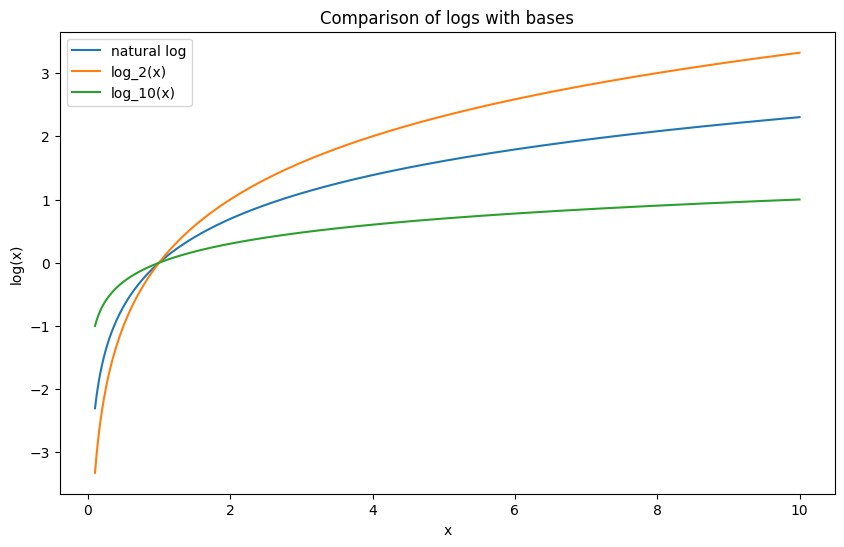

In [26]:
import matplotlib.pyplot as plt

x = np.linspace(0.1, 10, 400)

log_e = np.log(x)
log_2 = np.log2(x)
log_10 = np.log10(x)

plt.figure(figsize=(10, 6))
plt.plot(x, log_e, label='natural log')
plt.plot(x, log_2, label='log_2(x)')
plt.plot(x, log_10, label='log_10(x)')

plt.title("Comparison of logs with bases")
plt.xlabel("x")
plt.ylabel("log(x)")
plt.legend()
plt.show()

## Exercise 1.4

**Description**:

We're ready to calculate TF-IDF. Do that for the top 9 communities (by number of authors). Then for each community:

* List the 10 top TF words

**Solution**:

In [28]:
top_9_community_ids = np.array([id_and_count[0] for id_and_count in sorted_communities_by_counts[:9]])

print(f"Found the top 9 community ids as {top_9_community_ids}")

top_9_communities = community_abstracts[community_abstracts["community"].isin(top_9_community_ids)]

top_9_communities

Found the top 9 community ids as [ 3 10 42 12  5 26 16 20  0]


,community,tokens,tokens_length
0,0,"[observ, social_partner, primat, learn, reward...",214437
3,3,"[relat, pollut, birth, outcom, matern, exposur...",662732
5,5,"[abstract, mental, lexicon, complex_cognit, sy...",285217
10,10,"[abstract_background, evid_suggest, decis, con...",467764
12,12,"[communiti_detect, fundament_task, social_netw...",315526
16,16,"[research, relat_attitud, behavior, examin, li...",246654
20,20,"[examin, age_onset, time, dynam, mechan_under,...",367950
26,26,"[model, mate_choic, tactic, assum, femal, rand...",320295
42,42,"[electron_medic, record, emr, enabl_technolog,...",382869


Similarly as earlier the TDF's are calculated and the top 10 terms are extracted

In [32]:
top_9_communities_expanded = top_9_communities.copy() # Copy top 9 communities to not make a mess
exploded = top_9_communities_expanded.explode("tokens") # Explode into tokens

token_counts  = exploded.groupby(["community", "tokens"]).size().reset_index(name="count")
# group inside each community and get the token count store it in column "count"

total_tokens = exploded.groupby("community").size().reset_index(name="total")
# Group only by community such we can get the total counts

tf_df = token_counts.merge(total_tokens, on="community") # Merge total_tokens onto token_counts so we can divide after and get the TF

tf_df["TF"] = tf_df["count"] / tf_df["total"]

sorted_descending_by_tf = tf_df.sort_values(["TF"], ascending=[False]) # Sort it decending order by TF such term with highest TF is up.
top_10_per_community = sorted_descending_by_tf.groupby("community").head(10).reset_index()
# Grouping by community to then get the 10 largest by .head(10) as they are sorted descendingly. Finnaly reshaping back using reset_index.

top_10_per_community_sorted = top_10_per_community.sort_values(["community"]) # sort such we get the terms 
# for each community next to each other. Easier when printing

print(f"{len(top_10_per_community_sorted)} terms")

for i in range(0, 90, 10):
    print(f"Community: {top_10_per_community_sorted.iloc[i]["community"]}, 10 Terms: {top_10_per_community_sorted[i: i+10]["tokens"].to_list()}")


90 terms
Community: 0, 10 Terms: ['network', 'model', 'use', 'dynam', 'effect', 'measur', 'find', 'distribut', 'system', 'show']
Community: 3, 10 Terms: ['set', 'show', 'model', 'use', 'effect', 'algorithm', 'result', 'problem', 'network', 'data']
Community: 5, 10 Terms: ['data', 'system', 'approach', 'network', 'differ', 'imag', 'base', 'model', 'use', 'show']
Community: 10, 10 Terms: ['process', 'model', 'use', 'inform', 'studi', 'experi', 'relat', 'differ', 'effect', 'respons']
Community: 12, 10 Terms: ['base', 'system', 'use', 'model', 'relat', 'one', 'show', 'data', 'user', 'network']
Community: 16, 10 Terms: ['relat', 'data', 'studi', 'effect', 'measur', 'use', 'patient', 'model', 'inform', 'predict']
Community: 20, 10 Terms: ['model', 'effect', 'chang', 'econom', 'popul', 'use', 'increas', 'dynam', 'system', 'speci']
Community: 26, 10 Terms: ['model', 'cultur', 'system', 'show', 'use', 'agent', 'individu', 'studi', 'behavior', 'effect']
Community: 42, 10 Terms: ['base', 'model',


* List the 10 top TF-IDF words

**Solution**

The TF-IDF for each tokens are calculated

In [33]:
tf_idf_df = tf_df.copy().merge(IDF_df[["tokens", "idf"]], on="tokens", how="left") # Merge the idf_values onto each token in tf_df. 
# To prepare for calculating the tf-idf value.

tf_idf_df["tf-idf"] = tf_idf_df["TF"] * tf_idf_df["idf"]

tf_idf_df

,community,tokens,count,total,TF,idf,tf-idf
0,0,aaf,3,214437,0.000014,4.611815,0.000065
1,0,aal,1,214437,0.000005,3.407842,0.000016
2,0,aaron,1,214437,0.000005,2.877214,0.000013
3,0,abandon,9,214437,0.000042,1.632890,0.000069
4,0,abandoningith,1,214437,0.000005,5.710427,0.000027
...,...,...,...,...,...,...,...
274849,42,zuji,1,382869,0.000003,5.710427,0.000015
274850,42,zurfer,2,382869,0.000005,5.710427,0.000030
274851,42,zuyev,1,382869,0.000003,5.710427,0.000015
274852,42,zuylen,1,382869,0.000003,5.017280,0.000013


Finally the top 10 tf-idf tokens for the top 9 communities are extracted.

In [34]:
sorted_descending_by_tf_idf = tf_idf_df.sort_values(["tf-idf"], ascending=[False]) # Sort it decending order by 'tf-idf' such term with 
# highest tf-idf is furthest up.
top_10_per_community = sorted_descending_by_tf_idf.groupby("community").head(10).reset_index()
# Grouping by community to then get the 10 largest using .head(10) as they are sorted descendingly. Finnaly reshaping back using reset_index.

top_10_per_community_sorted = top_10_per_community.sort_values(["community"]) # sort such we get the terms 
# for each community next to each other. Easier when printing

print(f"{len(top_10_per_community_sorted)} terms")

for i in range(0, 90, 10):
    print(f"Community: {top_10_per_community_sorted.iloc[i]["community"]}, 10 Terms: {top_10_per_community_sorted[i: i+10]["tokens"].to_list()}")


90 terms
Community: 0, 10 Terms: ['network', 'exchang_rate', 'price', 'inflat', 'dynam', 'speci', 'countri', 'interest_rate', 'monetari_polici', 'volatil']
Community: 3, 10 Terms: ['algorithm', 'auction', 'bound', 'price', 'network', 'agent', 'task', 'model', 'set', 'user']
Community: 5, 10 Terms: ['motion', 'citi', 'dataset', 'network', 'emot', 'facial_express', 'video', 'imag', 'facial', 'user']
Community: 10, 10 Terms: ['memori', 'task', 'misinform', 'decis', 'choic', 'heurist', 'respond', 'item', 'judgment', 'particip']
Community: 12, 10 Terms: ['agent', 'soundscap', 'song', 'twitter', 'social_media', 'acoust', 'mathrm', 'network', 'user', 'ensuremath']
Community: 16, 10 Terms: ['mental_health', 'tobacco', 'social_media', 'patient', 'charact_strength', 'app', 'robot', 'cigarett', 'hiv', 'kib']
Community: 20, 10 Terms: ['conserv', 'biodivers', 'dispers', 'annuiti', 'tax', 'speci', 'econom', 'popul', 'habitat', 'ecolog']
Community: 26, 10 Terms: ['cultur', 'prefer', 'popul', 'negoti'

* List the top 3 authors (by degree)

**Solution**:

In [35]:
community_to_top_3_authors = defaultdict(list) # initialise default dict.

for community in top_9_communities["community"]: # loop each community
    comunity_authors = [author for author, _community in author_to_community_dict.items() if _community == community] 
    # filter authors for given community
    sorted_authors_by_degree = sorted(comunity_authors, key=lambda x: degrees_dict[x], reverse=True) 
    # sort authors in descending order by their degrees using degrees_dict
    community_to_top_3_authors[community] = sorted_authors_by_degree[:3] # store top 3 for later
    print(f"The top 3 authors by degree in community {community} are with ids: {', '.join(sorted_authors_by_degree[:3])}") # print top 3


The top 3 authors by degree in community 0 are with ids: https://openalex.org/A5038976962, https://openalex.org/A5063367289, https://openalex.org/A5011256345
The top 3 authors by degree in community 3 are with ids: https://openalex.org/A5087088138, https://openalex.org/A5091272738, https://openalex.org/A5055710645
The top 3 authors by degree in community 5 are with ids: https://openalex.org/A5007176508, https://openalex.org/A5048877432, https://openalex.org/A5088539840
The top 3 authors by degree in community 10 are with ids: https://openalex.org/A5017914184, https://openalex.org/A5068556395, https://openalex.org/A5057650206
The top 3 authors by degree in community 12 are with ids: https://openalex.org/A5021346979, https://openalex.org/A5049634383, https://openalex.org/A5081008532
The top 3 authors by degree in community 16 are with ids: https://openalex.org/A5044944954, https://openalex.org/A5010646067, https://openalex.org/A5076193392
The top 3 authors by degree in community 20 are w

* Are these 10 words more descriptive of the community? If yes, what is it about IDF that makes the words more informative?

**Solution**:

The IDF applies a weighing to the terms in the tf-idf which increases the value for rare words in comparison to more prevalent terms in the corpus. Words that are just generelly prevalent in the corpus is not very good at describing the differences between the individual communities.

When discerning the different communities the 10 words found using the tf-idf values are more descriptive as they account for the fact that some words are just generelly more prevalent in the corpus.  In other words, tf-idf highlights words that are frequent in one community but rare in the overall corpus. 

## Exercise 2

**Description**: The Wordcloud. It's time to visualize our results!

* Install the WordCloud module.

* Now, create word-cloud for each community. Feel free to make it as fancy or non-fancy as you like.

* Make sure that, together with the word cloud, you print the names of the top three authors in each community (see my plot above for inspiration).

**Solution**:

900 terms


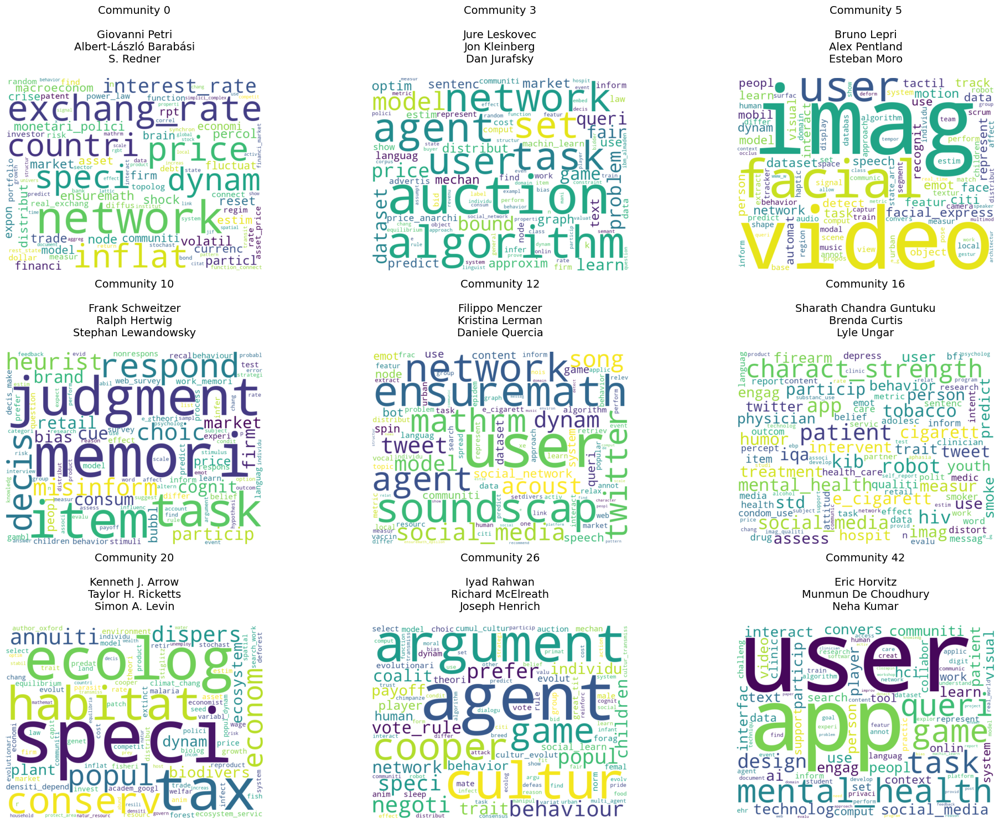

In [36]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

n = 100 # amounts of tokens

top_n_per_community = sorted_descending_by_tf_idf.groupby("community").head(n).reset_index()
# Grouping by community to then get the n largest using .head(n) as they are sorted descendingly. Finnaly reshaping back using reset_index.

top_n_per_community_sorted = top_n_per_community.sort_values(["community"]) # sort such we get the terms 
# for each community next to each other. Easier when plotting

print(f"{len(top_n_per_community_sorted)} terms")

fig, axes = plt.subplots(3, 3, figsize=(20, 15))

axes = axes.flatten()

for idx, community in enumerate(top_9_communities["community"]):
    top_words_df = top_n_per_community_sorted[top_n_per_community_sorted["community"] == community]
    word_freq = dict(zip(top_words_df['tokens'], top_words_df['tf-idf']))
    
    authors = community_to_top_3_authors[community]
    authors = authors_df[authors_df["id"].isin(authors)]["display_name"].to_numpy()
    author_str = "\n".join( authors)
        
    wc = WordCloud(width=800, height=600, background_color='white').generate_from_frequencies(word_freq)
    
    axes[idx].imshow(wc, interpolation='bilinear')
    axes[idx].set_title(f"Community {community}\n\n{author_str}", fontsize=14, pad=20)
    axes[idx].axis('off')

plt.tight_layout()
plt.show()


* Comment on your results. What can you conclude on the different sub-communities in Computational Social Science?

**Solution**:

The different communities seem to focusing on different sub areas of social sciences. Some insights as to what they could be focusing on have been given to each of them. 

* **Community 0**: "exchange_rate", "price", "inflat", "monetari_polic", "Network". Reflects economics and finance.

* **Community 3**:  "algorithm", "auction", "agent", and "network". To do with algorithms and economics.

* **Community 5**: "user", "imag", "facial", "video". To do with computer vision.

* **Community 10**: "memori", "judgement", "misinform", "task", "item". Suggests studies of cognitive ability.

* **Community 12**: "user", "network", "agent", "soundscap", "twitter". Suggests social media studies.

* **Community 16**:  "mental_health", "treatment", "patient", "social_media", and "intervent". A digital mental health focus.

* **Community 20**: "ecolog", "tax", "habitat" reflects research related to ecological themes.

* **Community 26**: "argument", "agent", "cultur". Suggests studies to do with Cultural behavior.

* **Community 42**: "user", "app", "game", "mental_health". Reflects mental health and playing computer.


* Look up online the top author in each community. In light of your search, do your results make sense?


**Solution**

When looking up the top authors of each community they do seem to make sense. 

Looking at the **Community 20** we get Kenneth J. Arrow (economist), Taylor H. Ricketts (ecologist) and Simon A. Levin (eclogist). Two ecologists and one economist. That corresponds to the theme of ecology found in its WordCloud.

In generel when searching up the authors it makes a lot of sense that they are the top authors in the different communities as they have been involved with the areas which the given community occupys itself with.


**Community 0**:  Giovanni Petri. Professor in the Network Science Institute at Northeastern University London.

**Community 3**: Jure Leskovec. Professor of Computer Science, Stanford University.

**Community 5**: Bruno Lepri.  Computational Social Science - Machine Learning - Network Science

**Community 10**: Frank Schweitzer. - systems design - complex systems - social organizations - economic systems

**Community 12**: Filippo Menczer.  Luddy Distinguished Professor of Informatics and Computer Science.

**Community 16**: Sharath Chandra Guntuku. Directs a computational social science listening lab. (Digital Health - Computational Psychology - Social Listening - Applied Machine Learning)

**Community 20**  Kenneth J. Arrow. Economist

**Community 26**: Iyad Rahwan. director of the Max Planck Institute for Human Development in Berlin.

**Community 42**: Eric Horvitz. Computer scientist

## Exercise 3

**Description**

* Go back to Week 1, Exercise 1. Revise what you wrote on the topics in Computational Social Science.

* In light of your data-driven analysis, has your understanding of the field changed? How? (max 150 words)

**Solution**

In light of the data-driven analysis we have learned a lot about the field. First and foremost, we have gained insight into what is possible to uncover with computational methods - and how it is done. The general structure we followed was to scrape text data from the web sampling - starting from a list of IC2S2 computational social science authors and expanding through their coauthors. We then applied various methods to process and analyze the data from multiple perspectives. Finally, we constructed a network graph, which was analyzed using algorithms that helped us decompose and interpret its structure.

Furthermore we have learned on the field of Computational Social Science which is a broad and interdisciplinary field with many sub areas. Based on our analysis, some of the subjects represented among the communities include themes such as ecology, digital mental health, behavioral economics and social media analysis.